# <center><span style='color:blue'>Projet 7 : Implémentez un modèle de scoring </span></center>

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

# <a id='1'>1. Introduction</a>

----------------------------------------------------------------------------------------------------------------------------
Les données sont issues d'un concours organisé sur Kaggle par l'entreprise "**Home Credit**".

Home Credit est un service dédié à la fourniture de prêts à la population non bancarisée.
Prédire si un client remboursera ou non un prêt ou s'il aura des difficultés est un besoin commercial essentiel,
et Home Credit organise cette compétition sur Kaggle pour voir quel type de modèles la communauté
de l'apprentissage automatique peut développer pour l'aider dans cette tâche.

Il y a 7 sources de données différentes :

   *  **application_train/application_test** : les principales données de train et de test avec des informations sur chaque demande de prêt chez Home Credit. Chaque prêt a sa propre ligne et est identifié par la caractéristique SK_ID_CURR. Les données de train sont accompagnées de la caractéristique TARGET indiquant 0 : le prêt a été remboursé ou 1 : le prêt n'a pas été remboursé.
   
   
   *  **bureau** : données concernant les crédits antérieurs du client auprès d'autres institutions financières. Chaque crédit précédent a sa propre ligne dans bureau, mais un prêt existant dans application_(train|test) peut avoir plusieurs crédits précédents.
   
   
   *  **bureau_balance** : données mensuelles concernant les crédits précédents dans bureau. Chaque ligne correspond à un mois de crédit précédent, et un crédit précédent unique peut avoir plusieurs lignes, une pour chaque mois de la durée du crédit.
   
   
  * **previous_application** : demandes précédentes de prêts a Home Credit des clients qui ont des prêts dans les données de application_(train|test). Chaque prêt actuel dans les données de application_(train|test) peut avoir plusieurs prêts précédents. Chaque demande précédente a une ligne et est identifiée par la caractéristique SK_ID_PREV.
  
  
  * **POS_CASH_BALANCE** : données mensuelles sur les prêts au point de vente ou en espèces que les clients ont eu avec Home Credit. Chaque ligne correspond à un mois d'un prêt au point de vente ou d'un prêt en espèces précédent, et un seul prêt précédent peut avoir plusieurs lignes.
  
  
  * **credit_card_balance** : données mensuelles sur les cartes de crédit que les clients ont eu avec Home Credit. Chaque ligne correspond à un mois de solde de carte de crédit, et une seule carte de crédit peut avoir plusieurs lignes.
  
  
  *  **installments_payment** : historique des paiements pour les prêts précédents chez Home Credit. Il y a une ligne pour chaque paiement effectué et une ligne pour chaque paiement manqué.

_________________


# <a id='2'>2. Importation des librairies</a>

In [2]:
import numpy as np
import pandas as pd
import math
import time
import matplotlib.pyplot as plt
import seaborn as sns
import gc
from contextlib import contextmanager
import importlib
import fonctions_utiles as fc
import pickle
import mlflow
import shap

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif, mutual_info_classif
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, learning_curve
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn import metrics
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek
import re

from evidently.report import Report
from evidently.metrics import DataDriftTable, DatasetDriftMetric
pd.options.display.max_columns = 200
np.random.seed(0)

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


# <a id='3'>3. Connexion serveur MLflow en local </a>

-  MLflow permet de se connecter au serveur pour le suivi des expériences de machine learning.

- Serveur MLflow en local : Si vous utilisez le serveur MLflow en local, l'adresse est généralement http://127.0.0.1:5000/ par défaut. Cela signifie que le serveur MLflow est accessible sur votre ordinateur local (localhost) via le port 5000. Vous pouvez ouvrir votre navigateur et accéder à cette adresse pour voir l'interface utilisateur MLflow.

In [3]:
#Connexion en local
mlflow.set_tracking_uri('http://127.0.0.1:5000/')



In [4]:
# mlflow.set_experiment("mlflow_tune_demo")

# <a id="4">4. Feature engineering </a>

kernel Kaggle utilisé : https://www.kaggle.com/code/jsaguiar/lightgbm-with-simple-features/script

In [5]:
@contextmanager
def timer(title):
    '''Fonction calculant le temps d'éxécution d'autres fonctions.
    Keyword arguments:
    title -- titre de la fonction exécutée.
    '''
    t0 = time.time()
    yield
    print("{} - réalisé en {:.0f}s".format(title, time.time() - t0))

def one_hot_encoder(df, nan_as_category = True):
    '''Encodage des variables catégorielles.
    Keyword arguments:
    df -- dataframe
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    df -- dataframe encodé
    new_columns -- nouvelles colonnes créées par l'encodage.
    '''
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category, dtype=int)
    new_columns = [c for c in df.columns if c not in original_columns]
    
    return df, new_columns

def application_train_test(num_rows = None, nan_as_category = False):
    '''Preprocessing de application_train.csv et application_test.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default False)
    Returns:
    df -- dataframe mergé et preprocessing réalisé.
    '''
    # Read data and merge
    df = pd.read_csv("C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/application_train.csv", nrows= num_rows)
    test_df = pd.read_csv("C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/application_test.csv", nrows= num_rows)
    print("Taille des données d'entrainement: {}, Taille des données de test: {}".format(len(df), len(test_df)))
    df = pd.concat([df,test_df], ignore_index=True)
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        df[bin_feature], uniques = pd.factorize(df[bin_feature])
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']

    del test_df
    gc.collect()
    
    return df

def bureau_and_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de bureau.csv et bureau_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    bureau_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    bureau = pd.read_csv('C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/bureau.csv', nrows = num_rows)
    bb = pd.read_csv('C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}
    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],
        'DAYS_CREDIT_UPDATE': ['mean'],
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],
        'AMT_ANNUITY': ['max', 'mean'],
        'CNT_CREDIT_PROLONG': ['sum'],
        'MONTHS_BALANCE_MIN': ['min'],
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    
    return bureau_agg

def previous_applications(num_rows = None, nan_as_category = True):
    '''Preprocessing de previous_applications.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    prev_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    prev = pd.read_csv('C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    
    return prev_agg

def pos_cash(num_rows = None, nan_as_category = True):
    '''Preprocessing de POS_CASH_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    pos_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    pos = pd.read_csv('C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    
    return pos_agg
    
def installments_payments(num_rows = None, nan_as_category = True):
    '''Preprocessing de installments_payments.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    ins_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    ins = pd.read_csv('C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    
    return ins_agg

def credit_card_balance(num_rows = None, nan_as_category = True):
    '''Preprocessing de credit_card_balance.csv.
    Keyword arguments:
    num_rows -- nombre de lignes (default None)
    nan_as_category -- ajout d'une colonne indiquant les NaN (default True)
    Returns:
    cc_agg -- dataframe aggregé et preprocessing réalisé.
    '''
    cc = pd.read_csv('C:/Users/gansane080944/Desktop/Formation_Data_Science/Projet7/donnee/credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    
    return cc_agg

In [6]:
num_rows = None
df = application_train_test(num_rows)

with timer("Process bureau and bureau_balance"):
    bureau = bureau_and_balance(num_rows)
    print("Bureau df shape:", bureau.shape)
    df = df.join(bureau, how='left', on='SK_ID_CURR')
    del bureau
    gc.collect()
with timer("Process previous_applications"):
    prev = previous_applications(num_rows)
    print("Previous applications df shape:", prev.shape)
    df = df.join(prev, how='left', on='SK_ID_CURR')
    del prev
    gc.collect()
with timer("Process POS-CASH balance"):
    pos = pos_cash(num_rows)
    print("Pos-cash balance df shape:", pos.shape)
    df = df.join(pos, how='left', on='SK_ID_CURR')
    del pos
    gc.collect()
with timer("Process installments payments"):
    ins = installments_payments(num_rows)
    print("Installments payments df shape:", ins.shape)
    df = df.join(ins, how='left', on='SK_ID_CURR')
    del ins
    gc.collect()
with timer("Process credit card balance"):
    cc = credit_card_balance(num_rows)
    print("Credit card balance df shape:", cc.shape)
    df = df.join(cc, how='left', on='SK_ID_CURR')
    del cc
    gc.collect()

Taille des données d'entrainement: 307511, Taille des données de test: 48744
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - réalisé en 15s
Previous applications df shape: (338857, 249)
Process previous_applications - réalisé en 17s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - réalisé en 8s
Installments payments df shape: (339587, 26)
Process installments payments - réalisé en 23s
Credit card balance df shape: (103558, 141)
Process credit card balance - réalisé en 18s


In [7]:
train_df = df[df['TARGET'].notnull()]
test_df = df[df['TARGET'].isnull()]
print("Taille des données d'entrainement: {}".format(len(train_df)))
print("Taille des données de test: {}".format(len(test_df)))

Taille des données d'entrainement: 307507
Taille des données de test: 48744


In [8]:
train_df.to_csv('train_df.csv', index = False)
test_df.to_csv('test_df.csv', index = False)

In [9]:
print("Taille du train: {}".format(train_df.shape))
print("Taille du test: {}".format(test_df.shape))

Taille du train: (307507, 797)
Taille du test: (48744, 797)


In [10]:
print("Nombre de lignes dupliquées dans train: {}".format(fc.data_duplicated(train_df)))
print("Nombre de lignes dupliquées test: {}".format(fc.data_duplicated(test_df)))

Nombre de lignes dupliquées dans train: 0
Nombre de lignes dupliquées test: 0


Il n'y a pas de doublons dans notre jeu de données. 

Voyons désormais les données manquantes.

In [11]:
print('Le dataset train :')
fc.missing_general(train_df)
print()
print('Le dataset test :')
fc.missing_general(test_df)

Le dataset train :
Nombre total de cellules manquantes : 63543529
Nombre de cellules manquantes en % : 25.93%

Le dataset test :
Nombre total de cellules manquantes : 8556452
Nombre de cellules manquantes en % : 22.02%


Nos deux dataset contiennent des données manquantes, voyons cela plus en détail.

In [12]:
fc.bar_missing(train_df)

In [13]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307507 entries, 0 to 307510
Columns: 797 entries, SK_ID_CURR to CC_COUNT
dtypes: float64(622), int32(133), int64(42)
memory usage: 1.7 GB


Nous avons 797 variables. On commence par supprimer celles ayant plus de 50% de valeurs manquantes.

In [14]:
train_df = fc.drop_columns_empty(train_df,0.5)

Suppression de la variable OWN_CAR_AGE avec % de valeurs manquantes 0.66
Suppression de la variable EXT_SOURCE_1 avec % de valeurs manquantes 0.56
Suppression de la variable APARTMENTS_AVG avec % de valeurs manquantes 0.51
Suppression de la variable BASEMENTAREA_AVG avec % de valeurs manquantes 0.59
Suppression de la variable YEARS_BUILD_AVG avec % de valeurs manquantes 0.66
Suppression de la variable COMMONAREA_AVG avec % de valeurs manquantes 0.7
Suppression de la variable ELEVATORS_AVG avec % de valeurs manquantes 0.53
Suppression de la variable ENTRANCES_AVG avec % de valeurs manquantes 0.5
Suppression de la variable FLOORSMIN_AVG avec % de valeurs manquantes 0.68
Suppression de la variable LANDAREA_AVG avec % de valeurs manquantes 0.59
Suppression de la variable LIVINGAPARTMENTS_AVG avec % de valeurs manquantes 0.68
Suppression de la variable LIVINGAREA_AVG avec % de valeurs manquantes 0.5
Suppression de la variable NONLIVINGAPARTMENTS_AVG avec % de valeurs manquantes 0.69
Suppres

In [15]:
train_df.shape

(307507, 561)

In [16]:
test_df = test_df[train_df.columns]
print(test_df.shape)

(48744, 561)


Il nous reste désormais 561 variables.

Voyons plus en détail certaines d'entre elles. La variable *'DAYS_BIRTH'* est négative car ce sont les jours enregistrés par rapport à la demande de prêt en cours. Nous allons donc transformer cette variable en nombre positifs représentant des années.

In [17]:
train_df['DAYS_BIRTH'].describe()

count    307507.000000
mean     -16037.027271
std        4363.982424
min      -25229.000000
25%      -19682.000000
50%      -15750.000000
75%      -12413.000000
max       -7489.000000
Name: DAYS_BIRTH, dtype: float64

In [18]:
(train_df['DAYS_BIRTH']/-365).describe()

count    307507.000000
mean         43.937061
std          11.956116
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [19]:
train_df['DAYS_BIRTH'] = train_df['DAYS_BIRTH']/-365
test_df['DAYS_BIRTH'] = test_df['DAYS_BIRTH']/-365

In [20]:
# change les valeurs négatives en valeurs positives.
train_df[train_df.columns[(train_df < 0).any()].tolist()] = train_df[
    train_df.columns[(train_df < 0).any()].tolist()]*-1

test_df[test_df.columns[(test_df < 0).any()].tolist()] = test_df[
    test_df.columns[(test_df < 0).any()].tolist()]*-1

In [21]:
train_df['DAYS_ID_PUBLISH'] = train_df['DAYS_ID_PUBLISH'].astype(float)
test_df['DAYS_ID_PUBLISH'] = test_df['DAYS_ID_PUBLISH'].astype(float)

In [22]:
train_df['DAYS_EMPLOYED'].describe()

count    252133.000000
mean       2384.142254
std        2338.327666
min          -0.000000
25%         767.000000
50%        1648.000000
75%        3175.000000
max       17912.000000
Name: DAYS_EMPLOYED, dtype: float64

- Transformation de la variable **TARGET** en entier et supression dans la base test.

In [23]:
train_df['TARGET'] = train_df['TARGET'].astype(int)
test_df = test_df.drop('TARGET',axis=1)

## Traitement des NaN

In [24]:
train_df = train_df.replace(np.inf, np.nan)
test_df = test_df.replace(np.inf, np.nan)

In [25]:
train_df.to_csv('train_df_nan.csv', index = False)
test_df.to_csv('test_df_nan.csv', index = False)

# <a id="5">5. Imputation </a>

Nous allons procéder à l'imputation de nos données en utilisant différentes méthodes simples. Pour les colonnes provenant de l'agrégation, nous remplacerons les valeurs manquantes par *0.0*. Pour les variables quantitatives restantes, nous les remplacerons par leur médiane. Enfin, pour les variables qualitatives/catégorielles, nous les remplacerons par le mode, c'est-à-dire la valeur la plus fréquente.

In [26]:
quanti_col = train_df.select_dtypes(['float64']).columns
quali_col = train_df.select_dtypes(['int64']).columns
# quali_col = quali_col.drop('TARGET')

In [27]:
# imputation des variables quantitatives issues de l'aggrégation
col_agg = train_df.columns[train_df.columns.str.contains('_MIN|_MAX|_MEAN|_VAR|_SUM|_SIZE')]

train_df[col_agg] = train_df[col_agg].fillna(0.0)
test_df[col_agg] = test_df[col_agg].fillna(0.0)

In [28]:
# target = application_train['TARGET']
# features_train = application_train.drop('TARGET', axis=1)

In [29]:
# imputation des variables quantitatives restantes
quanti_col_rest = [col for col in quanti_col if col not in col_agg]
for col in quanti_col_rest:
    median = train_df[col].median()
    train_df[col] = train_df[col].fillna(median)
    test_df[col] = test_df[col].fillna(median)

In [30]:
# imputation des variables qualitatives
for col in quali_col:
    mode = train_df[col].mode()[0]
    train_df[col] = train_df[col].fillna(mode)
    test_df[col] = test_df[col].fillna(mode)

In [31]:
print('Le dataset train :')
fc.missing_general(train_df)
print()
print('Le dataset test :')
fc.missing_general(test_df)

Le dataset train :
Nombre total de cellules manquantes : 0
Nombre de cellules manquantes en % : 0.00%

Le dataset test :
Nombre total de cellules manquantes : 0
Nombre de cellules manquantes en % : 0.00%


In [32]:
train_df.to_csv('train_df_cleaned.csv', index = False)
test_df.to_csv('test_df_cleaned.csv', index = False)

## Quelque statistique des variables après traitement

In [33]:
train_df.describe()

,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,...,PREV_NAME_SELLER_INDUSTRY_XNA_MEAN,PREV_NAME_SELLER_INDUSTRY_nan_MEAN,PREV_NAME_YIELD_GROUP_XNA_MEAN,PREV_NAME_YIELD_GROUP_high_MEAN,PREV_NAME_YIELD_GROUP_low_action_MEAN,PREV_NAME_YIELD_GROUP_low_normal_MEAN,PREV_NAME_YIELD_GROUP_middle_MEAN,PREV_NAME_YIELD_GROUP_nan_MEAN,PREV_PRODUCT_COMBINATION_Card Street_MEAN,PREV_PRODUCT_COMBINATION_Card X-Sell_MEAN,PREV_PRODUCT_COMBINATION_Cash_MEAN,PREV_PRODUCT_COMBINATION_Cash Street: high_MEAN,PREV_PRODUCT_COMBINATION_Cash Street: low_MEAN,PREV_PRODUCT_COMBINATION_Cash Street: middle_MEAN,PREV_PRODUCT_COMBINATION_Cash X-Sell: high_MEAN,PREV_PRODUCT_COMBINATION_Cash X-Sell: low_MEAN,PREV_PRODUCT_COMBINATION_Cash X-Sell: middle_MEAN,PREV_PRODUCT_COMBINATION_POS household with interest_MEAN,PREV_PRODUCT_COMBINATION_POS household without interest_MEAN,PREV_PRODUCT_COMBINATION_POS industry with interest_MEAN,PREV_PRODUCT_COMBINATION_POS industry without interest_MEAN,PREV_PRODUCT_COMBINATION_POS mobile with interest_MEAN,PREV_PRODUCT_COMBINATION_POS mobile without interest_MEAN,PREV_PRODUCT_COMBINATION_POS other with interest_MEAN,PREV_PRODUCT_COMBINATION_POS others without interest_MEAN,PREV_PRODUCT_COMBINATION_nan_MEAN,APPROVED_AMT_ANNUITY_MIN,APPROVED_AMT_ANNUITY_MAX,APPROVED_AMT_ANNUITY_MEAN,APPROVED_AMT_APPLICATION_MIN,APPROVED_AMT_APPLICATION_MAX,APPROVED_AMT_APPLICATION_MEAN,APPROVED_AMT_CREDIT_MIN,APPROVED_AMT_CREDIT_MAX,APPROVED_AMT_CREDIT_MEAN,APPROVED_APP_CREDIT_PERC_MIN,APPROVED_APP_CREDIT_PERC_MAX,APPROVED_APP_CREDIT_PERC_MEAN,APPROVED_APP_CREDIT_PERC_VAR,APPROVED_AMT_DOWN_PAYMENT_MIN,APPROVED_AMT_DOWN_PAYMENT_MAX,APPROVED_AMT_DOWN_PAYMENT_MEAN,APPROVED_AMT_GOODS_PRICE_MIN,APPROVED_AMT_GOODS_PRICE_MAX,APPROVED_AMT_GOODS_PRICE_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MIN,APPROVED_HOUR_APPR_P

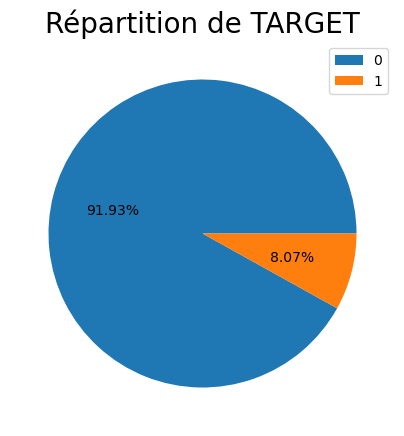

In [34]:
fc.pie_plot(train_df,['TARGET'])

Pour notre target, 1 correspond aux clients en difficulté de paiement (il a eu un retard de paiement de plus de X jours sur au moins une des Y premières échéances du crédit de notre échantillon), 0 correspond aux autres clients (qui n'ont donc pas de difficultés de paiement).

On constate que notre target est déséquilibrée. En effet, notre dataframe comporte beaucoup plus de clients ne possédant pas de difficultés de paiement (91.93%).

Nous verrons par la suite comment nous pouvons rééquilibrer notre target en vue d'une modélisation.




Nous allons désormais étudier les densités de certaines variables via un graphique KDE.
Un graphique d'estimation de la densité du noyau (KDE) est une méthode de visualisation de la distribution des observations dans un ensemble de données, analogue à un histogramme. KDE représente les données à l'aide d'une courbe de densité de probabilité continue dans une ou plusieurs dimensions.
Par rapport à un histogramme, KDE peut produire un tracé moins encombré et plus interprétable, en particulier lors du dessin de plusieurs distributions.

Text(0.5, 1.0, 'Distribution of Ages')

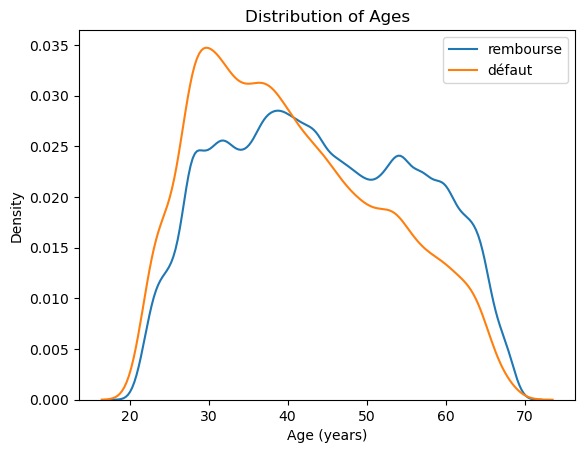

In [35]:
sns.kdeplot(train_df.loc[train_df['TARGET'] == 0, 'DAYS_BIRTH'], label = 'rembourse')
sns.kdeplot(train_df.loc[train_df['TARGET'] == 1, 'DAYS_BIRTH'], label = 'défaut')

plt.xlabel('Age (years)')
plt.ylabel('Density')
plt.legend()
plt.title('Distribution of Ages')

On peut constater ici que la courbe représentant les clients en défaut tend vers des âges plus jeunes, par rapport à la courbe représentant les clients qui remboursent. Cela pourrait signifier que les clients en défaut ont plus tendance à être jeunes.

In [36]:
X = train_df.drop(['TARGET'], axis=1)
y = train_df['TARGET']

In [37]:
# Nous devons retirer les caractères spéciaux des noms des features pour l'utilisation de certains modèles (LightGBM)
# X=train_df.copy()
# y=target
X = X.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
test_df = test_df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

Ce code ci-dessous divise les données (X et y) en ensembles d'entraînement (X_train, y_train) et de validation (X_val, y_val) en utilisant la fonction train_test_split() avec un test_size de 20%, une stratification basée sur y et une seed random_state fixée à 0 pour la reproductibilité.

In [38]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.20, stratify=y, random_state=0)

print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)

(246005, 560) (246005,)
(61502, 560) (61502,)


In [39]:
cols = X_train.select_dtypes(['float64']).columns

In [40]:
cols

Index(['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       ...
       'INSTAL_AMT_INSTALMENT_MEAN', 'INSTAL_AMT_INSTALMENT_SUM',
       'INSTAL_AMT_PAYMENT_MIN', 'INSTAL_AMT_PAYMENT_MAX',
       'INSTAL_AMT_PAYMENT_MEAN', 'INSTAL_AMT_PAYMENT_SUM',
       'INSTAL_DAYS_ENTRY_PAYMENT_MAX', 'INSTAL_DAYS_ENTRY_PAYMENT_MEAN',
       'INSTAL_DAYS_ENTRY_PAYMENT_SUM', 'INSTAL_COUNT'],
      dtype='object', length=387)